# Which advanced positions take the most time to develop?

Recently, Sam Esfandiara [posited a theory](https://twitter.com/samesfandiari/status/1231947582051454982):
    
"Theory: In the modern NBA, wings take longest to develop."

This tweet resulted in much controversy and debate. In short, several, including Sam and Ethan Sherwood Strauss argued in favor of the wing being the position that takes longest to develop, but others such as Kevin Pelton and Mo Dakhil argued for the gaurd/point gaurd.

## The Argument for Wings

Sam later posted [this tweet](https://twitter.com/samesfandiari/status/1231948399869431813). In short, the argument for wings is that they "have the most responsibility, to cover the most roles". Sam stated that their roles are:
* Ability to guard multiple positions
* Ability to help
* Play on and off the ball
* ...

## The Argument for Gaurds

Pelton [later rebutted](https://twitter.com/kpelton/status/1232115274431651841). In short, point guards skills require more experience/skill.

We can investigate this using the [basketball player grades provided by the BBall-Index](https://www.bball-index.com/2017-18-player-grades/). Having scraped all the data from 2014-15 to 2017-18 (all available seasons), we can dive into some meta-statistics to understand how certain positions improved at relevant skills over the 4 year span.

In [2]:
import pandas as pd
df = pd.read_csv('2017_18.csv')
df.head()

,NAME,TEAM,POSITION,ADVANCED_POSITION,OFFENSIVE_ROLE,NUMDATA,PERIMETER_SHOT,PERIMETER_SHOT_GRADE,OFF_BALL_MOVEMENT,OFF_BALL_MOVEMENT_GRADE,...,INTERIOR_DEFENSE,INTERIOR_DEFENSE_GRADE,OREB,OREB_GRADE,DREB,DREB_GRADE,USAGE,USAGE_GRADE,SELF_CREATION,SELF_CREATION_GRADE
0,LeBron James,CLE,PF,Wing,Point Forwards,3948,0.756,B+,0.958,A,...,0.735,B,0.597,C+,0.926,A,0.993,High,0.774,High
1,Klay Thompson,GSW,SG,Wing,Off-Ball Workers,3300,0.978,A,0.843,A-,...,0.695,B,0.321,D,0.501,C,0.840,Medium,0.196,Low
2,Jrue Holiday,NOP,SG,Wing,Creators,3275,0.526,C,0.533,C,...,0.564,C+,0.532,C,0.618,B-,0.936,High,0.592,High
3,Khris Middleton,MIL,SF,Wing,Secondary Creators,3257,0.741,B+,0.357,D+,...,0.500,C,0.245,D-,0.740,B+,0.917,High,0.487,Medium
4,Bradley Beal,WAS,SG,Guard,Secondary Creators,3193,0.804,A-,0.639,B-,...,0.432,C-,0.288,D,0.375,D+,0.952,High,0.519,High


Let's classify each skill as either a *wing skill* or a *guard skill*.

In [3]:
df.columns

Index(['NAME', 'TEAM', 'POSITION', 'ADVANCED_POSITION', 'OFFENSIVE_ROLE',
       'NUMDATA', 'PERIMETER_SHOT', 'PERIMETER_SHOT_GRADE',
       'OFF_BALL_MOVEMENT', 'OFF_BALL_MOVEMENT_GRADE', 'ONE_ON_ONE',
       'ONE_ON_ONE_GRADE', 'FINISHING', 'FINISHING_GRADE', 'ROLL_GRAVITY',
       'ROLL_GRAVITY_GRADE', 'PLAYMAKING', 'PLAYMAKING_GRADE', 'POST_PLAY',
       'POST_PLAY_GRADE', 'PERIMETER_DEFENSE', 'PERIMETER_DEFENSE_GRADE',
       'INTERIOR_DEFENSE', 'INTERIOR_DEFENSE_GRADE', 'OREB', 'OREB_GRADE',
       'DREB', 'DREB_GRADE', 'USAGE', 'USAGE_GRADE', 'SELF_CREATION',
       'SELF_CREATION_GRADE'],
      dtype='object')

We can classify these skills into the following categories based on what skills **epitomize** each position:

## Wing Skills

* `PERIMETER_SHOT`
* `OFF_BALL_MOVEMENT`
* `ONE_ON_ONE`
* `FINISHING`
* `PERIMETER_DEFENSE`
* `SELF_CREATION`
       
## Guard Skills

* `PERIMETER_SHOT`
* `ONE_ON_ONE`
* `FINISHING` 
* `PLAYMAKING`
* `SELF_CREATION`

In [4]:
def get_wing_data(year):
    wing_skills = ['PERIMETER_SHOT', 'OFF_BALL_MOVEMENT', 
                   'ONE_ON_ONE', 'FINISHING', 'PERIMETER_DEFENSE', 'SELF_CREATION']
    y_df = pd.read_csv(f'{year}.csv')
    wing_y_df = y_df[y_df['ADVANCED_POSITION']=='Wing']
    df2 = wing_y_df[['NAME']+wing_skills]
    df2['YEAR'] = year.replace('_','-')
    return df2

def get_guard_data(year):
    guard_skills = ['PERIMETER_SHOT',
                   'ONE_ON_ONE', 'FINISHING', 'PLAYMAKING', 'SELF_CREATION']
    y_df = pd.read_csv(f'{year}.csv')
    guard_y_df = y_df[y_df['ADVANCED_POSITION']=='Guard']
    df2 = guard_y_df[['NAME']+guard_skills]
    df2['YEAR'] = year.replace('_','-')
    return df2

In [5]:
wing_df = pd.DataFrame()
guard_df = pd.DataFrame()
for y in range(2014, 2018):
    s = f'{y}_{str(y+1)[2:]}'
    wing_df = wing_df.append(get_wing_data(s))
    guard_df = guard_df.append(get_guard_data(s))
wing_df = wing_df.reset_index().drop('index', axis=1)
guard_df = guard_df.reset_index().drop('index', axis=1)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


In [6]:
wing_df.head()

,NAME,PERIMETER_SHOT,OFF_BALL_MOVEMENT,ONE_ON_ONE,FINISHING,PERIMETER_DEFENSE,SELF_CREATION,YEAR
0,James Harden,0.911,0.901,0.986,0.778,0.774,0.764,2014-15
1,Trevor Ariza,0.667,0.339,0.444,0.608,0.745,0.190,2014-15
2,LeBron James,0.803,0.913,0.880,0.992,0.554,0.816,2014-15
3,Klay Thompson,0.980,0.700,0.972,0.742,0.604,0.321,2014-15
4,Joe Johnson,0.732,0.475,0.890,0.239,0.365,0.583,2014-15


In [7]:
guard_df.head()

,NAME,PERIMETER_SHOT,ONE_ON_ONE,FINISHING,PLAYMAKING,SELF_CREATION,YEAR
0,Stephen Curry,0.982,0.955,0.910,0.964,0.570,2014-15
1,Chris Paul,0.929,0.738,0.480,0.971,0.802,2014-15
2,Kyrie Irving,0.965,0.990,0.642,0.877,0.734,2014-15
3,Damian Lillard,0.734,0.970,0.836,0.959,0.718,2014-15
4,John Wall,0.514,0.653,0.683,0.970,0.768,2014-15


Now, let's add another column to the current dataframes indicating the years of experience the player has in the league.

In [49]:
from basketball_reference_scraper.players import get_stats

for i, r in list(guard_df.iterrows()):
    print(r['NAME'])
    try:
        stats_df = get_stats(r['NAME'])
        rookie_year = int(stats_df.iloc[0]['SEASON'][:4])
        years_in_league = int(r['YEAR'][:4])-rookie_year
        guard_df.at[i, 'YRS_IN_LEAGUE'] = years_in_league
    except:
        pass
for i, r in list(wing_df.iterrows()):
    print(r['NAME'])
    try:
        stats_df = get_stats(r['NAME'])
        rookie_year = int(stats_df.iloc[0]['SEASON'][:4])
        years_in_league = int(r['YEAR'][:4])-rookie_year
        wing_df.at[i, 'YRS_IN_LEAGUE'] = years_in_league
    except:
        pass

Stephen Curry
Chris Paul
Kyrie Irving
Damian Lillard
John Wall
Eric Bledsoe
Jeff Teague
Ty Lawson
Goran Dragic
Victor Oladipo
Avery Bradley
Kyle Lowry
Bradley Beal
Elfrid Payton
Mike Conley
Jarrett Jack
Mario Chalmers
Michael Carter-Williams
Deron Williams
Russell Westbrook
Trey Burke
Reggie Jackson
Iman Shumpert
Tony Parker
Eric Gordon
Jason Terry
Kemba Walker
Louis Williams
Greivis Vasquez
Rajon Rondo
Brandon Knight
Aaron Brooks
Derrick Rose
Maurice Williams
DJ Augustin
Norris Cole
Tony Allen
Jeremy Lin
Zach LaVine
Marcus Smart
Matthew Dellavedova
Rodney Stuckey
Shane Larkin
Isaiah Thomas
Shaun Livingston
Jerryd Bayless
Dante Exum
Austin Rivers
Dennis Schroder
Devin Harris
Kirk Hinrich
Patrick Beverley
Wayne Ellington
Beno Udrih
Steve Blake
Darren Collison
J.J. Barea
Marco Belinelli
Pablo Prigioni
Jordan Clarkson
Cory Joseph
Langston Galloway
Ray McCallum
CJ Watson
Jameer Nelson
Ramon Sessions
Jrue Holiday
Brian Roberts
Jose Calderon
George Hill
Andre Miller
Leandro Barbosa
Gary Neal

Jae Crowder
Kyle Singler
Dante Cunningham
Manu Ginobili
Carlos Boozer
Joe Ingles
Evan Fournier
Kent Bazemore
Caron Butler
Michael Kidd-Gilchrist
Lance Stephenson
Tony Snell
Al Farouq Aminu
Rasual Butler
Lance Thomas
Derrick Williams
Jodie Meeks
Brandan Wright
Gerald Green
Anthony Tolliver
Carmelo Anthony
Danilo Gallinari
Omri Casspi
Tayshaun Prince
Jerami Grant
Kevin Martin
Mike Scott
Richard Jefferson
Quincy Acy
Vince Carter
Andre Roberson
Chase Budinger
Ryan Kelly
Kobe Bryant
JaKarr Sampson
Nik Stauskas
Shawn Marion
Randy Foye
Shawne Williams
Rodney Hood
James Ennis
Damjan Rudez
Nick Young
Will Barton
James Jones
Thabo Sefolosha
Nick Calathes
Elijah Millsap
Kevin Durant
Alec Burks
Joey Dorsey
Shabazz Muhammad
Luke Babbitt
Chris Copeland
Kostas Papanikolaou
Aaron Gordon
Mike Miller
Hedo Turkoglu
Robbie Hummel
Jabari Parker
Allen Crabbe
Gary Harris
Maurice Harkless
Travis Wear
Justin Holiday
Alonzo Gee
Cleanthony Early
Jeremy Lamb
Perry Jones
Henry Walker
TJ Warren
Danny Granger
Dorell

JaMychal Green
Justin Jackson
Wesley Johnson
Luke Kennard
Josh Hart
Nemanja Bjelica
Royce O'Neale
Manu Ginobili
Rudy Gay
Semi Ojeleye
Corey Brewer
Lance Thomas
Maurice Harkless
Joe Johnson
Alex Abrines
Maxi Kleber
Gerald Green
Davis Bertans
Sindarius Thornwell
Jodie Meeks
Norman Powell
Ben McLemore
Treveon Graham
Andre Roberson
Vince Carter
Wesley Iwundu
Tyler Dorsey
Jerryd Bayless
Dion Waiters
Jabari Parker
Sam Dekker
Langston Galloway
Malik Monk
Paul Zipser
Timothe Luwawu-Cabarrot
Thabo Sefolosha
Sterling Brown
Omri Casspi
DeAndre Liggins
Cedi Osman
Luke Babbitt
CJ Williams
Wayne Selden
Chandler Parsons
Jared Dudley
Arron Afflalo
Danilo Gallinari
Zach LaVine
Sean Kilpatrick
Torrey Craig
Terrence Ross
Malik Beasley
Brandon Paul
Abdel Nader
Justin Anderson
Jonathan Isaac
Kyle Collinsworth
Damyean Dotson
T.J. Leaf
DeAndre' Bembry
Dorian Finney-Smith
Shabazz Muhammad
Danuel House
Ron Baker
Myke Henry
Glenn Robinson
JaKarr Sampson
Patrick Beverley
Luke Kornet
Malachi Richardson
Antonio Bl

Now that we have that data, let's save it so we don't need to scrape it again.

In [98]:
#wing_df.to_csv('wing_data.csv', index=False)
#guard_df.to_csv('guard_data.csv', index=False)
wing_df = pd.read_csv('wing_data.csv')
guard_df = pd.read_csv('guard_data.csv')

# Analysis

First, let's filter so we only have young guards and wings. We'll perform this operation by finding all names of guards/wings with their `YRS_IN_LEAGUE` is 0.

In [99]:
young_wing_names = wing_df[wing_df['YRS_IN_LEAGUE']==0]['NAME']
young_guard_names = guard_df[guard_df['YRS_IN_LEAGUE']==0]['NAME']

## Plotting Statistical Improvement for all Players

Here, we plot the grade of **each** individual player for each skill. The data will appear noisy, but it will give us a general idea of what we're looking at.

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
%matplotlib inline

In [101]:
def plot_stat(stat, df, names, pos):
    l = stat.split('_')
    stat_name = ''
    for i in l:
        stat_name += i[0]+i[1:].lower()+' '
    stat_name+='Grade'
    plot_df = pd.DataFrame(columns=['Player', 'Year', stat_name])
    for player in names:
        p_df = df[df['NAME']==player]
        x = p_df['YEAR'].unique()
        y = p_df[stat]
        df2 = pd.DataFrame(columns=['Player', 'Year', stat_name])
        df2['Year'] = x
        df2[stat_name] = y.values
        df2['Player'] = player
        plot_df = plot_df.append(df2)
    fig, ax = plt.subplots(figsize=(50, 50))
    sns.pointplot(data=plot_df, x='Year', y=stat_name, hue='Player', ax=ax)
    ax.set_title(f'{stat_name} Improvement for all Young {pos} from 2014-2018', fontsize=50)
    ax.set_xlabel('Year', fontsize=40)
    ax.set_ylabel(f'{stat_name}', fontsize=40)
    fig.canvas.draw()
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=30)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=30)
    ax.legend_.remove()
    ax.figure.savefig(f'{stat}_{pos}.png', bbox_inches='tight', pad_inches=1)

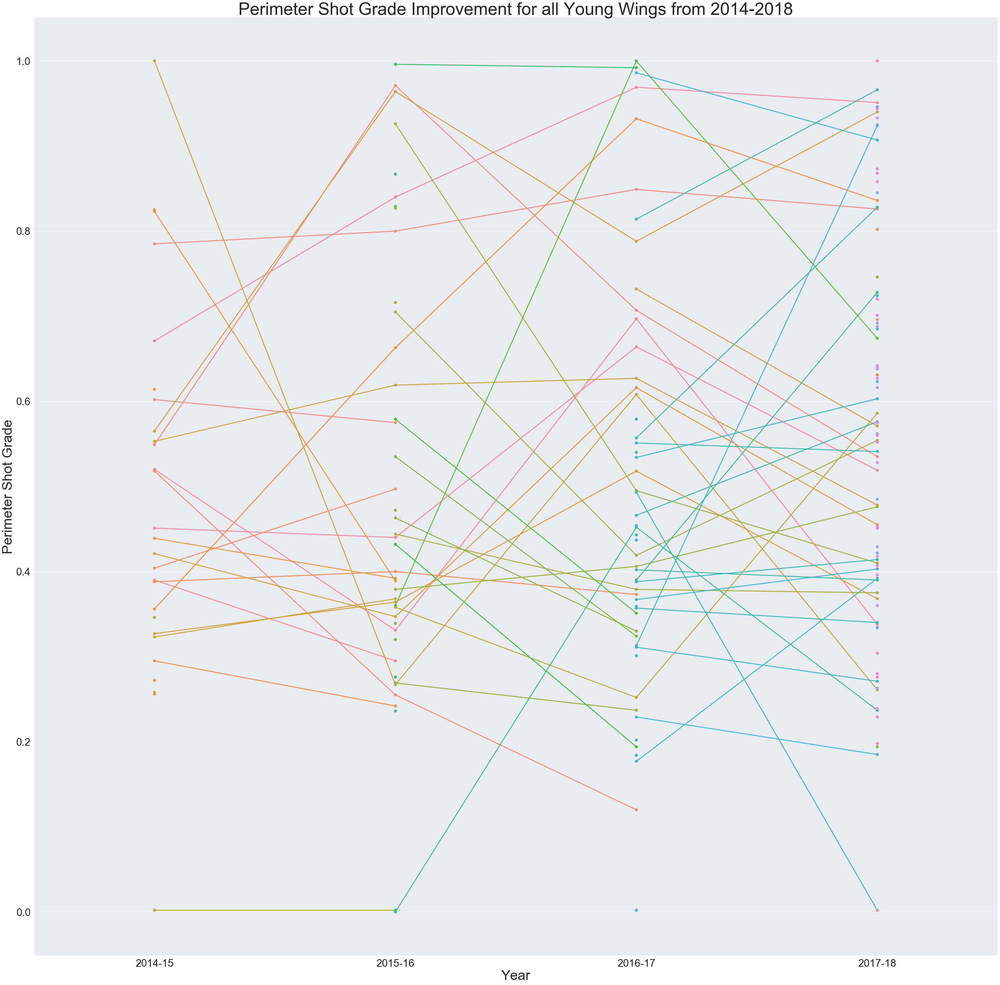

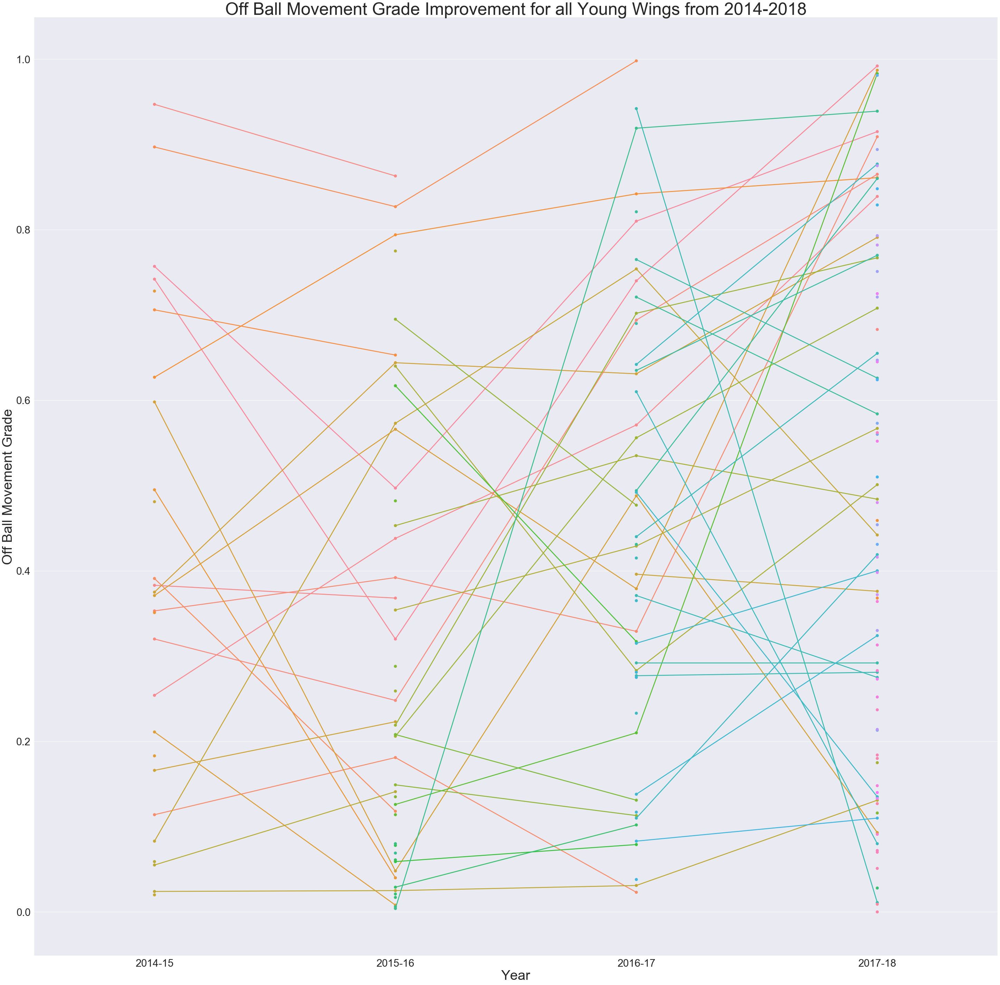

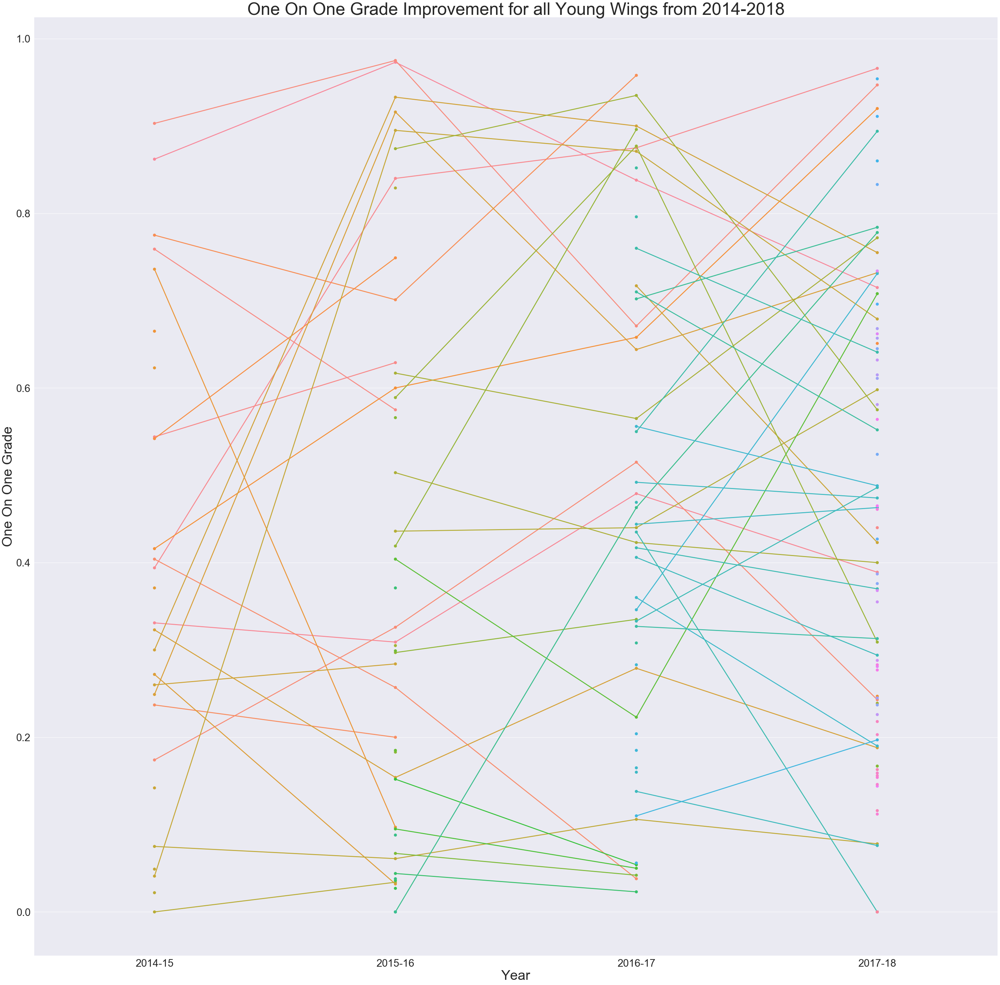

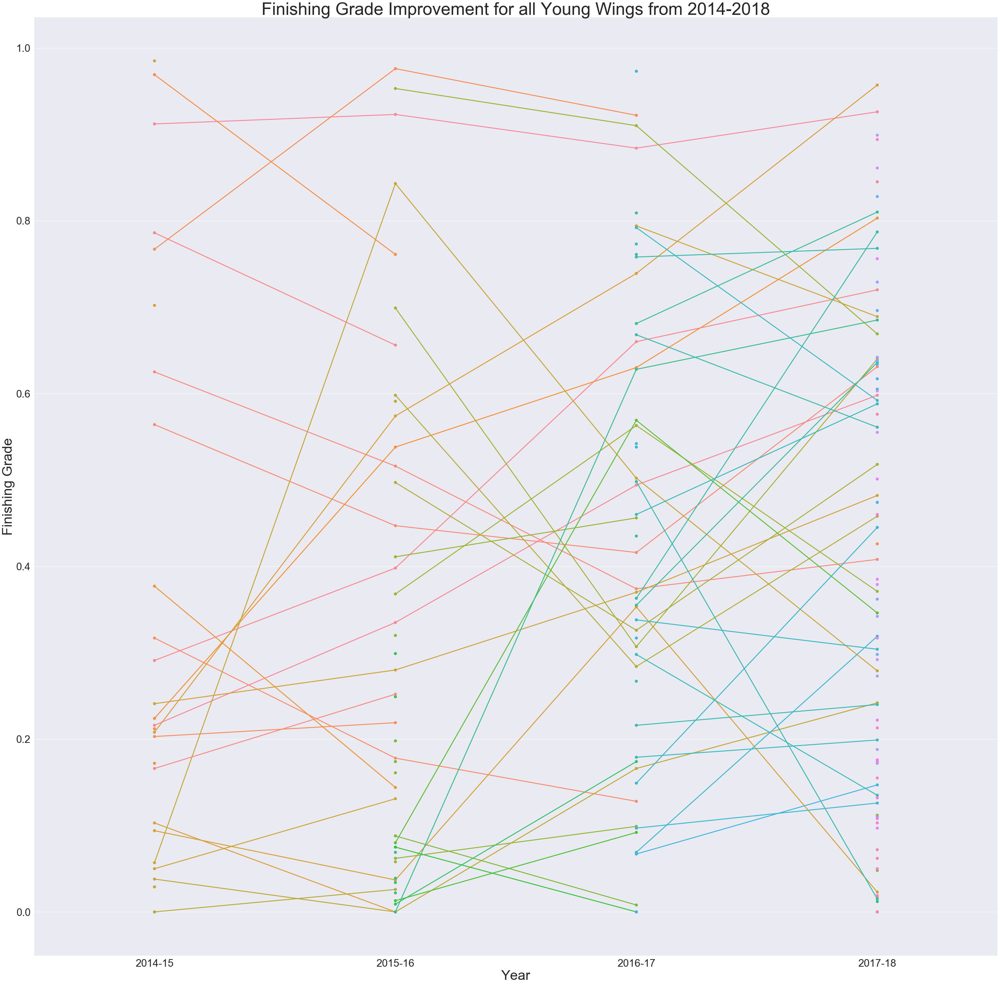

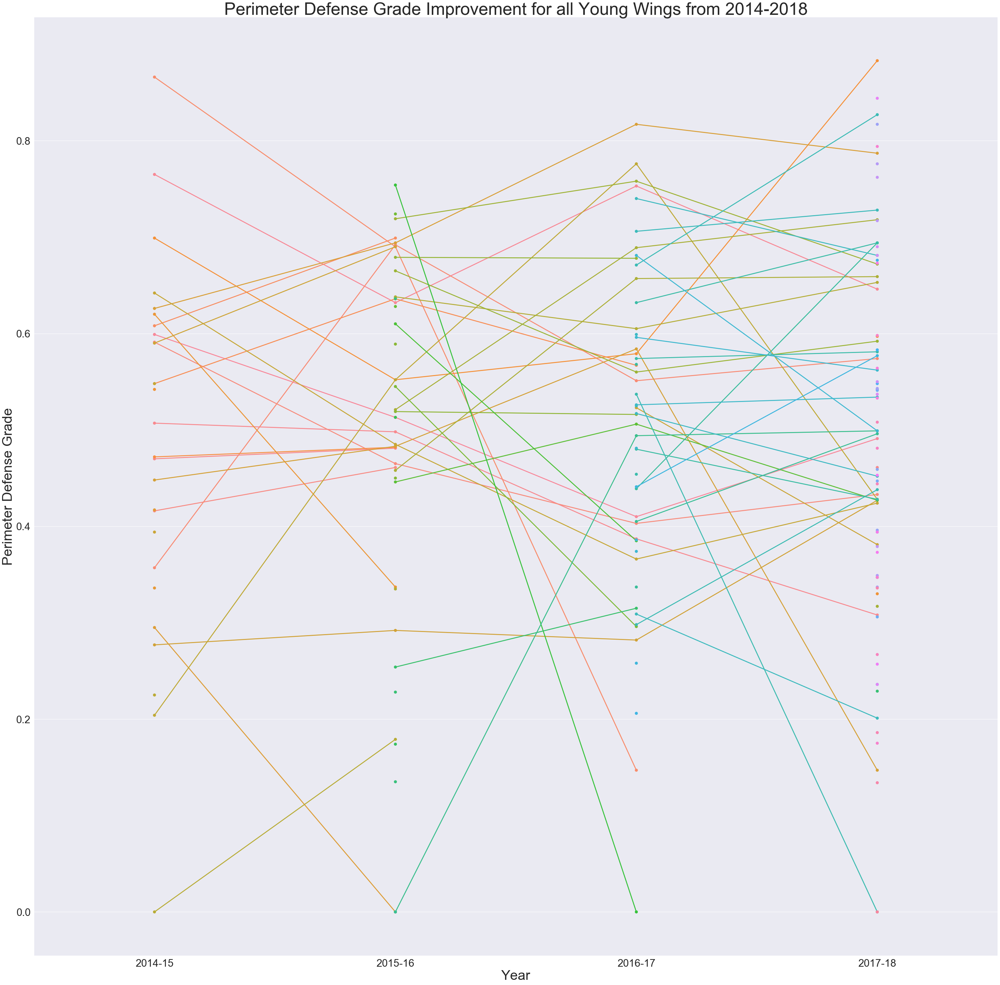

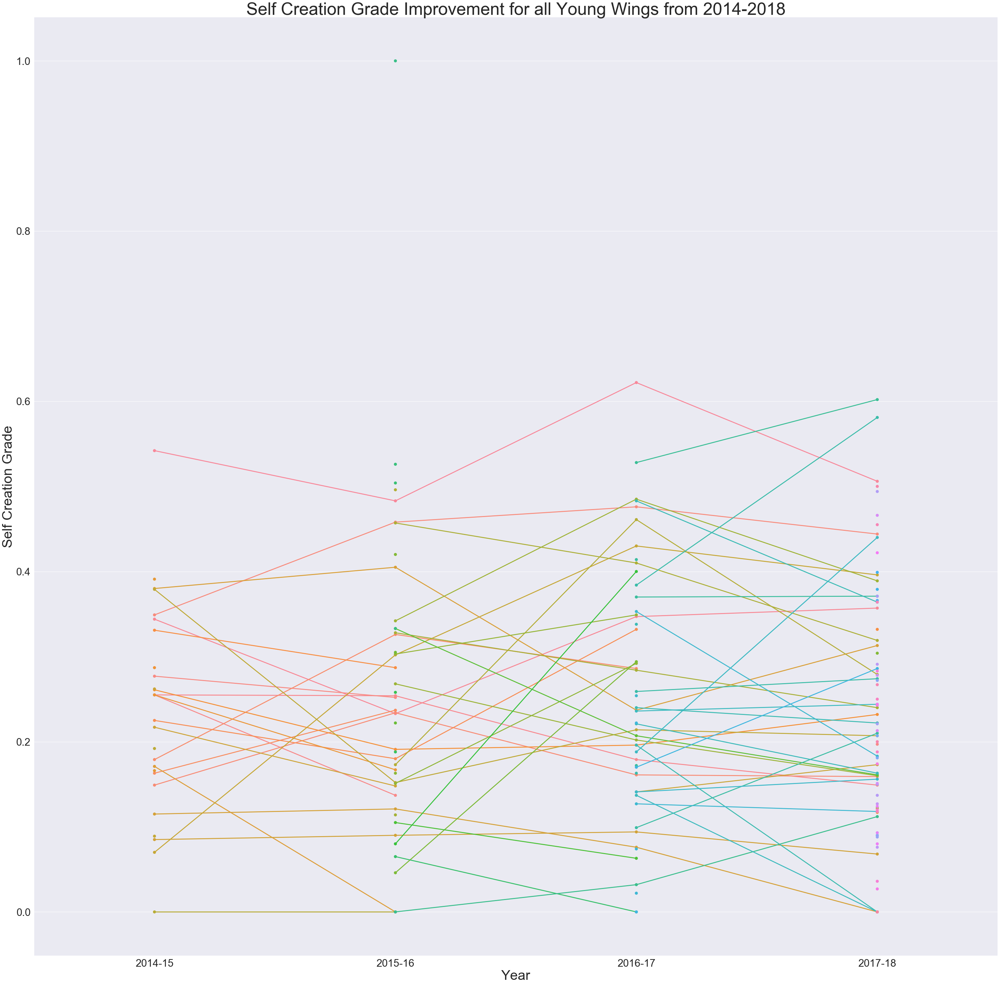

In [102]:
wing_skills = ['PERIMETER_SHOT', 'OFF_BALL_MOVEMENT', 
                'ONE_ON_ONE', 'FINISHING', 'PERIMETER_DEFENSE', 'SELF_CREATION']
for s in wing_skills:
    plot_stat(s, wing_df, young_wing_names, 'Wings')

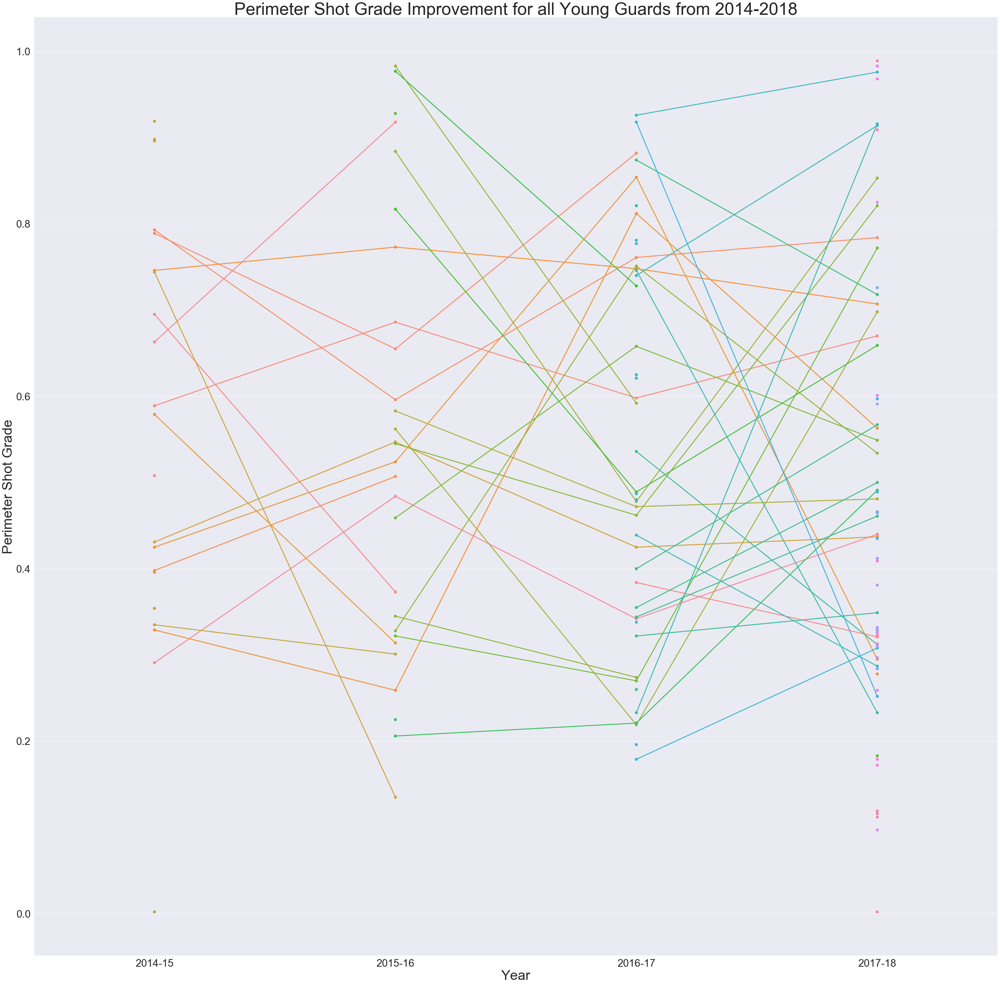

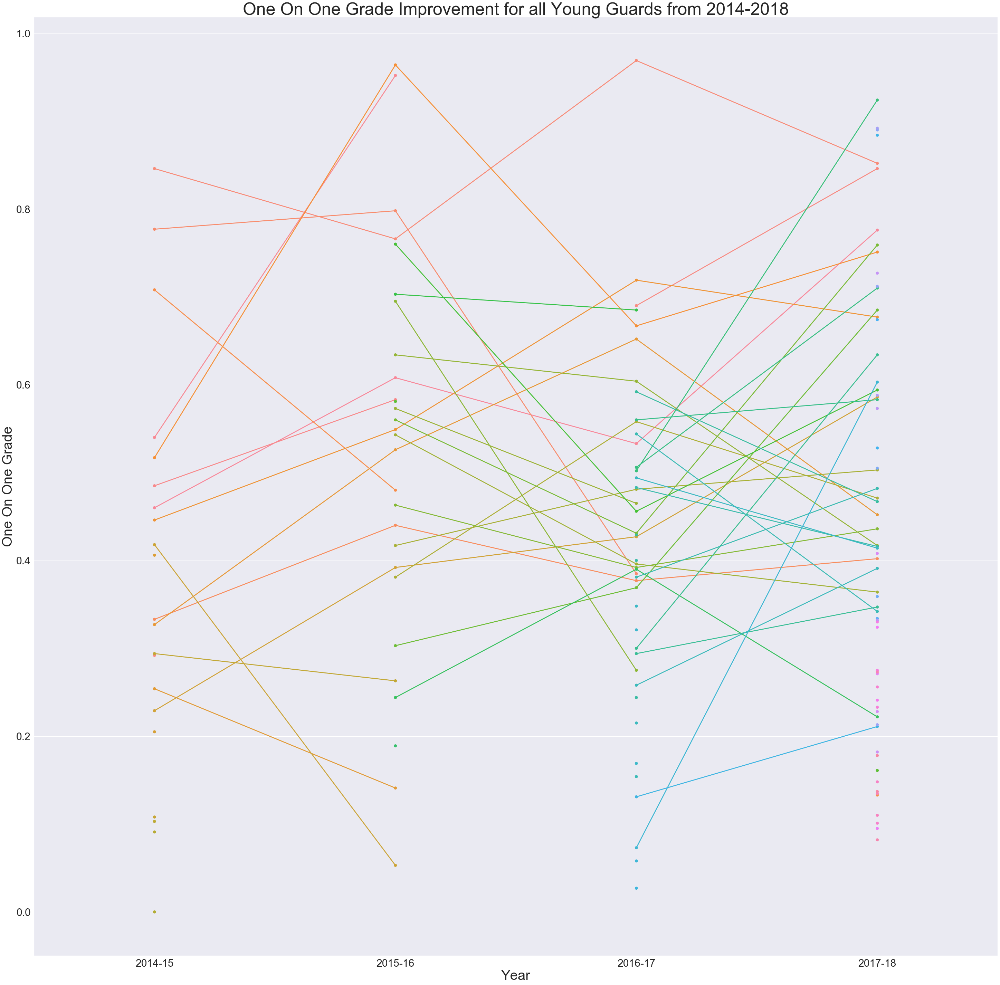

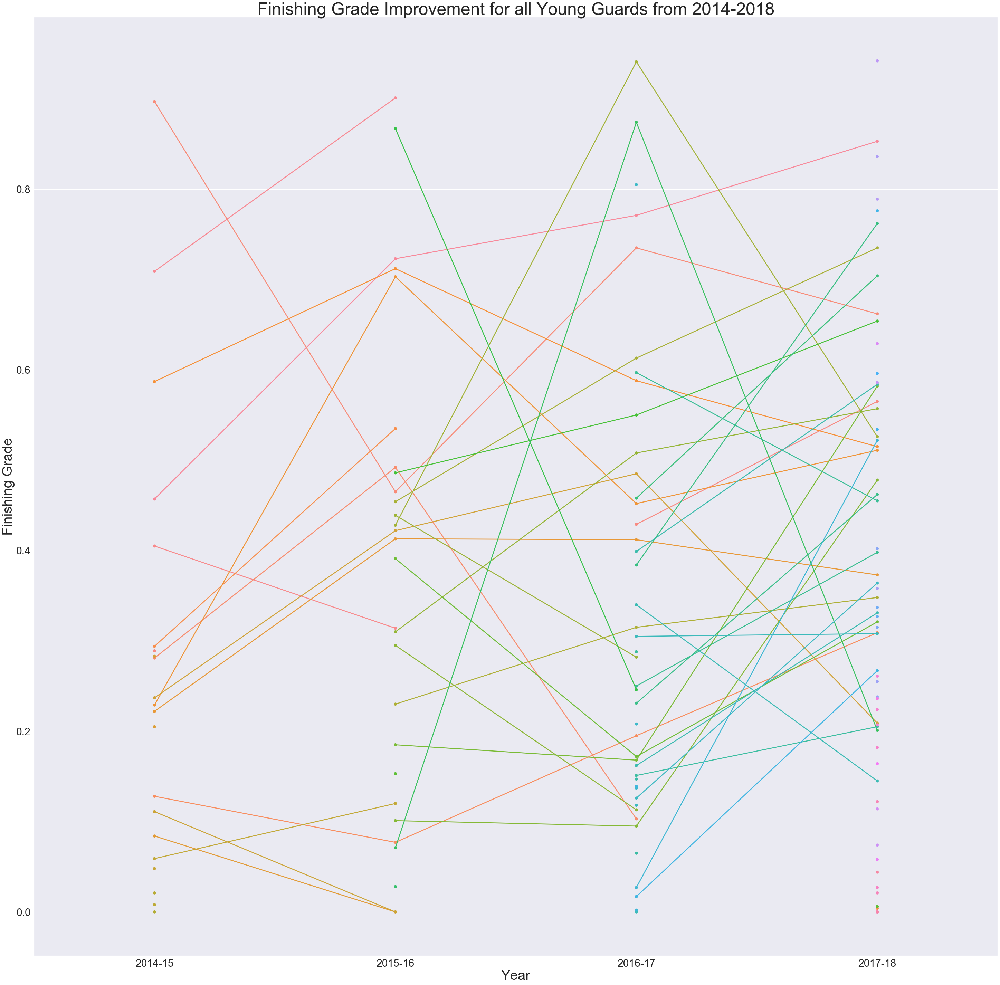

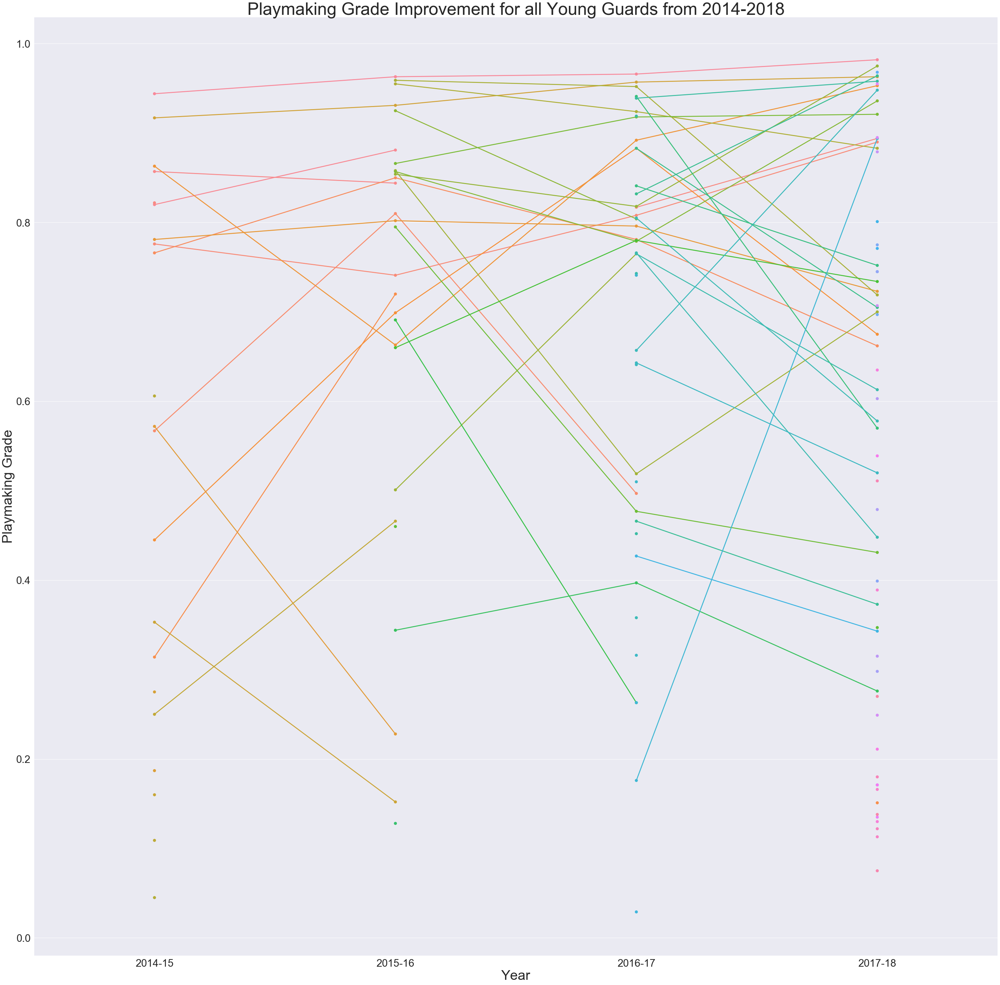

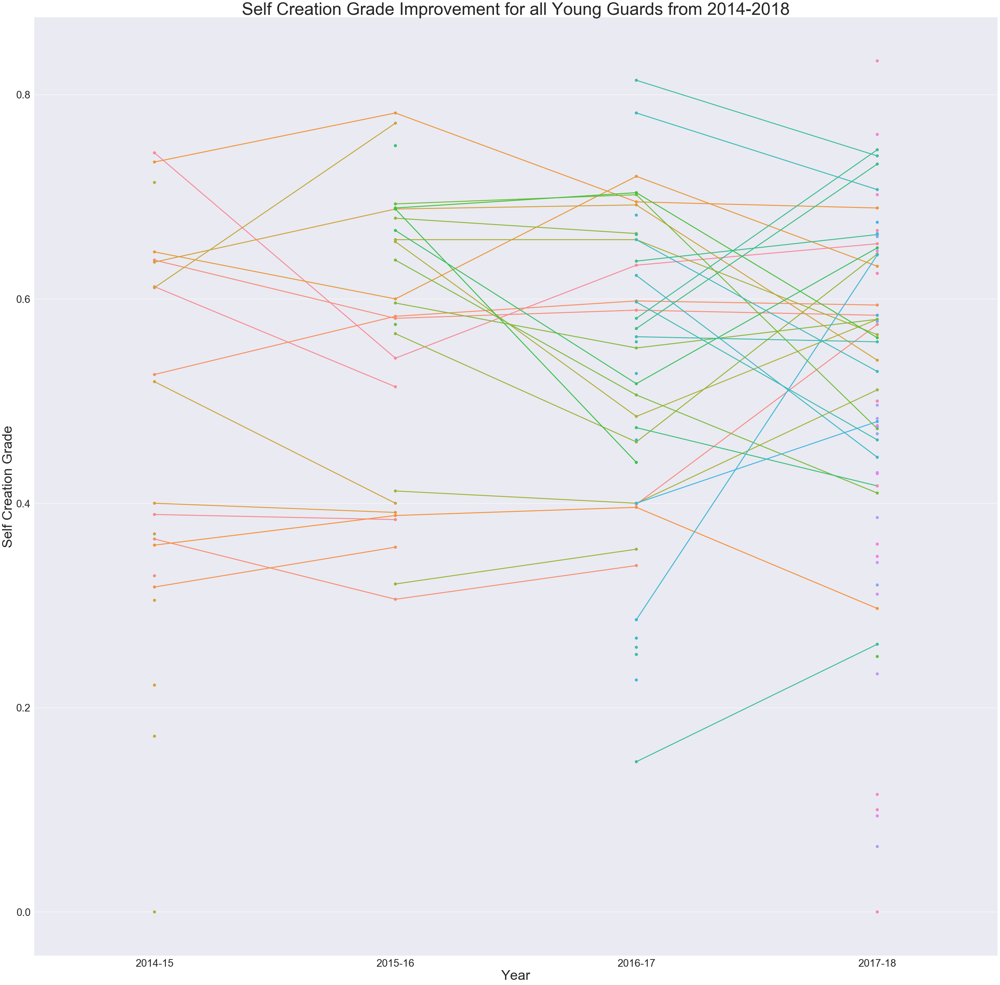

In [103]:
guard_skills = ['PERIMETER_SHOT',
                   'ONE_ON_ONE', 'FINISHING', 'PLAYMAKING', 'SELF_CREATION']
for s in guard_skills:
    plot_stat(s, guard_df, young_guard_names, 'Guards')

Like I said, **very** noisy.

Let's clarify this data by finding the Year to Year difference in each skill for each player.

## Plotting Average Y2Y Improvement of a Certain Skill

Here, we take an individual `stat` and find the average year to year improvement of an individual player.
Then, we average the year to year improvement for each `stat` and plot the results.

In [104]:
def get_y2y_improvement(stat, df, names):
    d = {}
    for player in names:
        p_df = df[df['NAME']==player]
        p_df[f'{stat}_Y2Y_DIFF'] = p_df[stat].pct_change()
        p_df.fillna(0, inplace=True)
        x = p_df['YRS_IN_LEAGUE']
        y = p_df[f'{stat}_Y2Y_DIFF']
        for i in range(0, len(x.values)):
            yr = x.values[i]
            if yr not in d:
                d[yr] = []
            if y.values[i]==float('inf'):
                d[yr].append(0)
            else:
                d[yr].append(y.values[i]*100)
    for i in d:
        d[i] = sum(d[i])/len(d[i])
    return d

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


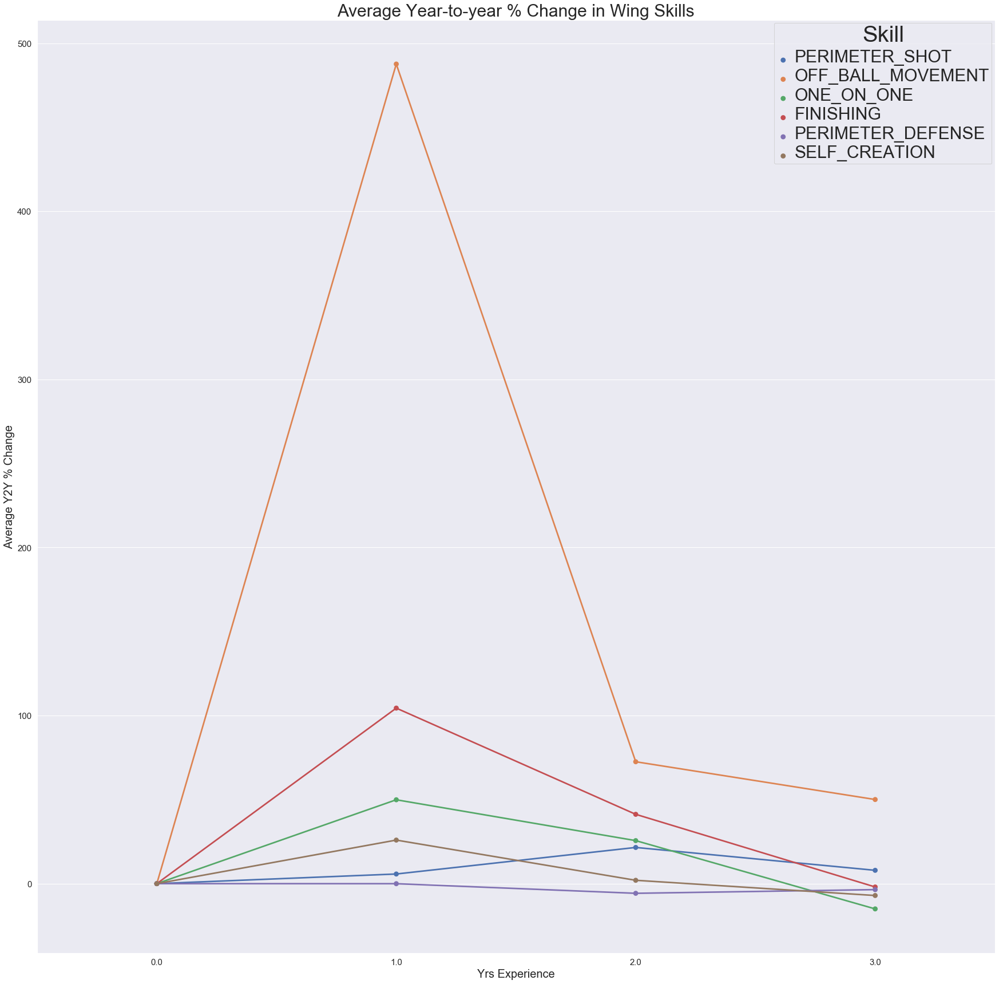

In [105]:
wing_skills = ['PERIMETER_SHOT', 'OFF_BALL_MOVEMENT', 
                'ONE_ON_ONE', 'FINISHING', 'PERIMETER_DEFENSE', 'SELF_CREATION']
plot_df = pd.DataFrame(columns=['Experience', 'Y2Y Improvement', 'Skill'])
for s in wing_skills:
    d = get_y2y_improvement(s, wing_df, young_wing_names)
    df2 = pd.DataFrame(columns=['Experience', 'Y2Y Improvement', 'Skill'])
    df2['Experience'] = list(d.keys())
    df2['Y2Y Improvement'] = list(d.values())
    df2['Skill'] = s
    plot_df = plot_df.append(df2)
fig, ax = plt.subplots(figsize=(30, 30))
sns.pointplot(data=plot_df, x='Experience', y='Y2Y Improvement', hue='Skill')
ax.set_title(f'Average Year-to-year % Change in Wing Skills', fontsize=30)
ax.set_xlabel('Yrs Experience', fontsize=20)
ax.set_ylabel(f'Average Y2Y % Change', fontsize=20)
fig.canvas.draw()
ax.set_xticklabels(ax.get_xticklabels(), fontsize=15)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=15)
plt.setp(ax.get_legend().get_texts(), fontsize=30) # for legend text
plt.setp(ax.get_legend().get_title(), fontsize=40) # for legend title
ax.figure.savefig(f'wing_y2y.png', bbox_inches='tight', pad_inches=1)

## Wing Takeaways
* Note the scale on this grid! Evidently, wings improve **MASSIVELY** continuously, but peter out by approximately year 3
* Interesting how much improvement their is in each skill. Off ball movement appears to be the most significant change upon arriving in the league and continues to be throughout the first couple years



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


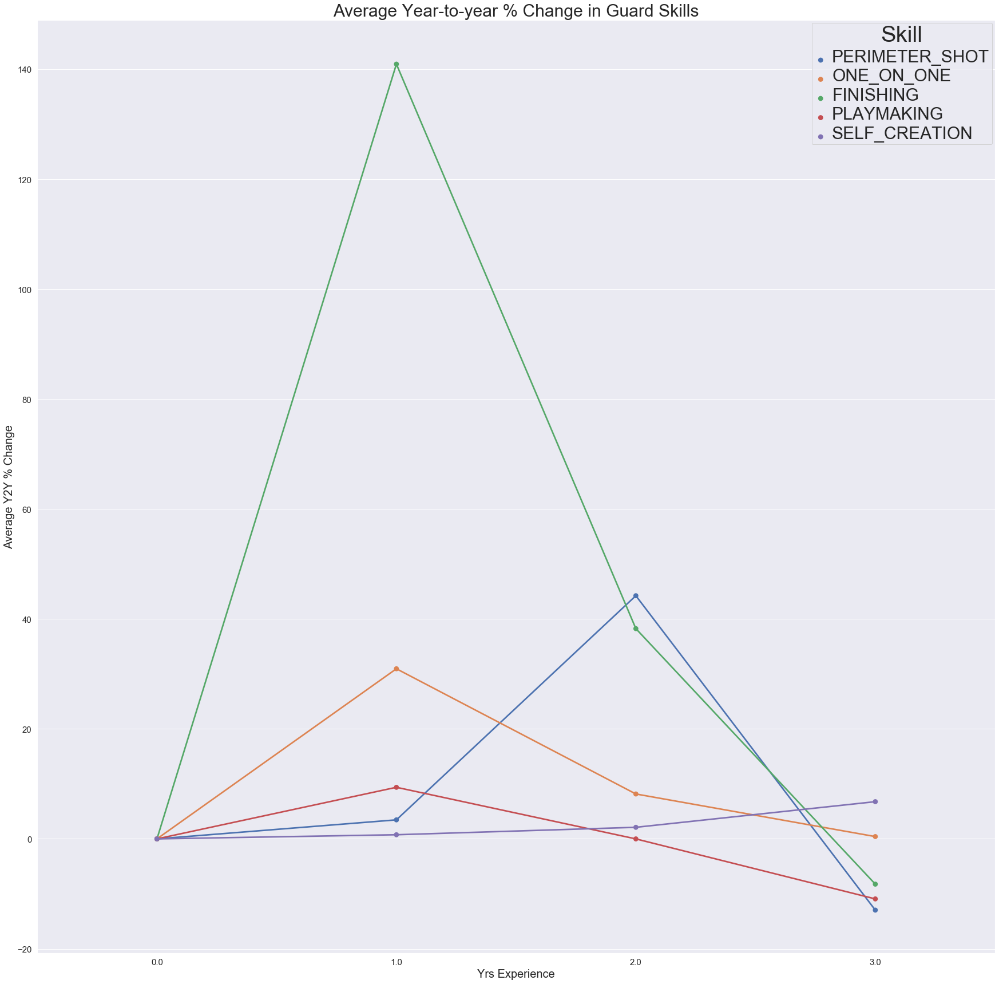

In [106]:
guard_skills = ['PERIMETER_SHOT',
                   'ONE_ON_ONE', 'FINISHING', 'PLAYMAKING', 'SELF_CREATION']
plot_df = pd.DataFrame(columns=['Experience', 'Y2Y Improvement', 'Skill'])
for s in guard_skills:
    d = get_y2y_improvement(s, guard_df, young_guard_names)
    df2 = pd.DataFrame(columns=['Experience', 'Y2Y Improvement', 'Skill'])
    df2['Experience'] = list(d.keys())
    df2['Y2Y Improvement'] = list(d.values())
    df2['Skill'] = s
    plot_df = plot_df.append(df2)
fig, ax = plt.subplots(figsize=(30, 30))
sns.pointplot(data=plot_df, x='Experience', y='Y2Y Improvement', hue='Skill')
ax.set_title(f'Average Year-to-year % Change in Guard Skills', fontsize=30)
ax.set_xlabel('Yrs Experience', fontsize=20)
ax.set_ylabel(f'Average Y2Y % Change', fontsize=20)
fig.canvas.draw()
ax.set_xticklabels(ax.get_xticklabels(), fontsize=15)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=15)
plt.setp(ax.get_legend().get_texts(), fontsize=30) # for legend text
plt.setp(ax.get_legend().get_title(), fontsize=40) # for legend title
ax.figure.savefig(f'guard_y2y.png', bbox_inches='tight', pad_inches=1)

## Guard Takeaways

* Note the scale on this graph - **NOT** as significant!
* Once again, guards also peter out by year 3
* Guards seem to improve most at finishing and one-on-one play

# Conclusions

According my plots above, the takeaway is fairly clear. Simply the scale on the plots seems to indicate that the majority of the improvement occurs between years 0-3. In this timespan, wings improve **greatly** at their most relevant skills, whereas guards do not.

As a result, I think it is reasonable to conclude that **GUARDS** are the more difficult to develop than wings. Overall, wings seem to improve more easily than guards as indicated by the scales on the above plots.